<a href="https://colab.research.google.com/github/allansdefreitas/synthetic-dataset-object-detection/blob/main/OK_allan_generator_for_yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Detailed explanation:
https://medium.com/@alexppppp/how-to-create-synthetic-dataset-for-computer-vision-object-detection-fd8ab2fa5249

GitHub repo:
https://github.com/alexppppp/synthetic-dataset-object-detection

In [1]:
"""
Customized by Allan

Prepare Environment


!cp -r "/content/drive/Othercomputers/laptop Emprel/DRIVE_CIN/MsC/dissertacao/code/synthetic-dataset-object-detection/" "/content"
"""

'\nCustomized by Allan\n\nPrepare Environment\n\n\n!cp -r "/content/drive/Othercomputers/laptop Emprel/DRIVE_CIN/MsC/dissertacao/code/synthetic-dataset-object-detection/" "/content"\n'

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=False)

Mounted at /content/drive


In [3]:
!git clone https://github.com/alexppppp/synthetic-dataset-object-detection

Cloning into 'synthetic-dataset-object-detection'...
remote: Enumerating objects: 413, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 413 (delta 2), reused 11 (delta 2), pack-reused 401
Receiving objects: 100% (413/413), 170.37 MiB | 15.39 MiB/s, done.
Resolving deltas: 100% (30/30), done.


# 1. Imports

In [4]:
PATH_MAIN = "/content/synthetic-dataset-object-detection/data"

In [5]:
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import albumentations as A
import time
from tqdm import tqdm
import shutil

# 2. Paths to files

In [6]:
obj_dict = {
    1: {'folder': "battery", 'longest_min': 150, 'longest_max': 800},
    2: {'folder': "lightbulb", 'longest_min': 150, 'longest_max': 800},
    3: {'folder': "padlock", 'longest_min': 150, 'longest_max': 800}
}



for k, _ in obj_dict.items():
    folder_name = obj_dict[k]['folder']

    files_imgs = sorted(os.listdir(os.path.join(PATH_MAIN, folder_name, 'images')))
    files_imgs = [os.path.join(PATH_MAIN, folder_name, 'images', f) for f in files_imgs]

    files_masks = sorted(os.listdir(os.path.join(PATH_MAIN, folder_name, 'masks')))
    files_masks = [os.path.join(PATH_MAIN, folder_name, 'masks', f) for f in files_masks]

    obj_dict[k]['images'] = files_imgs
    obj_dict[k]['masks'] = files_masks

print("The first five files from the sorted list of battery images:", obj_dict[1]['images'][:5])
print("\nThe first five files from the sorted list of battery masks:", obj_dict[1]['masks'][:5])

files_bg_imgs = os.listdir(os.path.join(PATH_MAIN, 'bg'))
files_bg_imgs = [os.path.join(PATH_MAIN, 'bg', f) for f in files_bg_imgs]

files_bg_noise_imgs = os.listdir(os.path.join(PATH_MAIN, "bg_noise", "images"))
files_bg_noise_imgs = [os.path.join(PATH_MAIN, "bg_noise", "images", f) for f in files_bg_noise_imgs]
files_bg_noise_masks = os.listdir(os.path.join(PATH_MAIN, "bg_noise", "masks"))
files_bg_noise_masks = [os.path.join(PATH_MAIN, "bg_noise", "masks", f) for f in files_bg_noise_masks]

print("\nThe first five files from the sorted list of background images:", files_bg_imgs[:5])
print("\nThe first five files from the sorted list of background noise images:", files_bg_noise_imgs[:5])
print("\nThe first five files from the sorted list of background noise masks:", files_bg_noise_masks[:5])

The first five files from the sorted list of battery images: ['/content/synthetic-dataset-object-detection/data/battery/images/1.png', '/content/synthetic-dataset-object-detection/data/battery/images/10.png', '/content/synthetic-dataset-object-detection/data/battery/images/11.png', '/content/synthetic-dataset-object-detection/data/battery/images/12.png', '/content/synthetic-dataset-object-detection/data/battery/images/13.png']

The first five files from the sorted list of battery masks: ['/content/synthetic-dataset-object-detection/data/battery/masks/1.png', '/content/synthetic-dataset-object-detection/data/battery/masks/10.png', '/content/synthetic-dataset-object-detection/data/battery/masks/11.png', '/content/synthetic-dataset-object-detection/data/battery/masks/12.png', '/content/synthetic-dataset-object-detection/data/battery/masks/13.png']

The first five files from the sorted list of background images: ['/content/synthetic-dataset-object-detection/data/bg/bg_23.jpg', '/content/sy

In [7]:
obj_dict[3]['images']

['/content/synthetic-dataset-object-detection/data/padlock/images/1.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/10.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/11.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/12.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/13.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/14.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/15.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/16.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/17.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/18.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/19.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/2.png',
 '/content/synthetic-dataset-object-detection/data/padlock/images/20.png',
 '/content/synthetic-datase

In [8]:
obj_dict[3]['images'][1]

'/content/synthetic-dataset-object-detection/data/padlock/images/10.png'

# 3. Images and masks

In [9]:
def get_img_and_mask(img_path, mask_path):

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

    mask_b = mask[:,:,0] == 0 # This is boolean mask
    mask = mask_b.astype(np.uint8) # This is binary mask

    return img, mask

Image file: /content/synthetic-dataset-object-detection/data/padlock/images/10.png
Mask file: /content/synthetic-dataset-object-detection/data/padlock/masks/10.png

Shape of the image of the object: (911, 857, 3)
Shape of the binary mask: (911, 857)


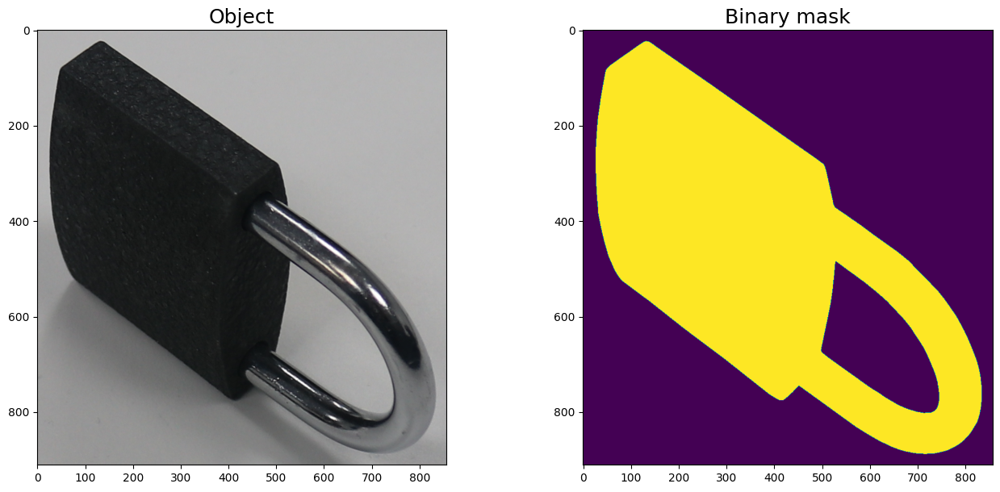

In [10]:
# Let's look at a random object and its binary mask

IMG_INDEX = 1
img_path = obj_dict[3]['images'][IMG_INDEX]
mask_path = obj_dict[3]['masks'][IMG_INDEX]

img, mask = get_img_and_mask(img_path, mask_path)

print("Image file:", img_path)
print("Mask file:", mask_path)
print("\nShape of the image of the object:", img.shape)
print("Shape of the binary mask:", mask.shape)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img)
ax[0].set_title('Object', fontsize=18)
ax[1].imshow(mask)
ax[1].set_title('Binary mask', fontsize=18);

# 4. Resizing background images

In [11]:
def resize_img(img, desired_max, desired_min=None):

    h, w = img.shape[0], img.shape[1]

    longest, shortest = max(h, w), min(h, w)
    longest_new = desired_max
    if desired_min:
        shortest_new = desired_min
    else:
        shortest_new = int(shortest * (longest_new / longest))

    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new

    transform_resize = A.Compose([
        A.Sequential([
        A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)
        ], p=1)
    ])

    transformed = transform_resize(image=img)
    img_r = transformed["image"]

    return img_r

Shape of the original background image: (2560, 1920, 3)
Shape of the resized background image (desired_max=1920, desired_min=None): (1920, 1440, 3)
Shape of the resized background image (desired_max=1920, desired_min=1080): (1920, 1080, 3)


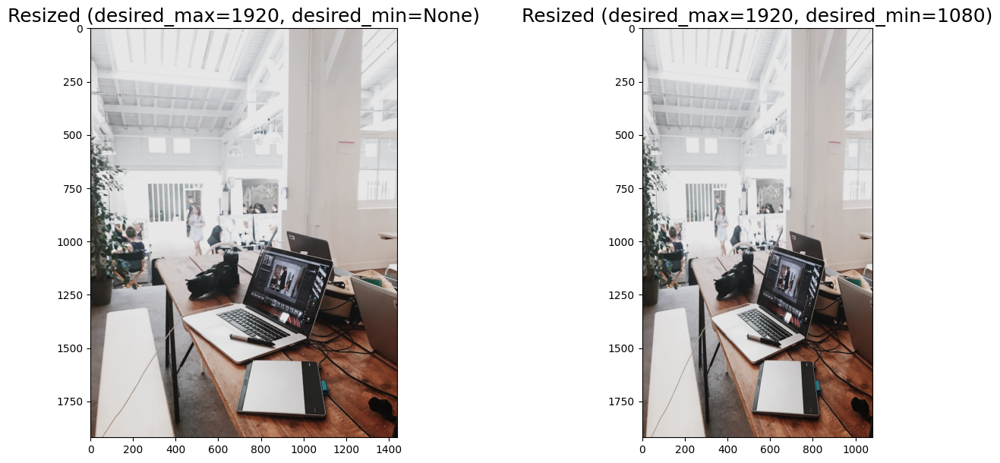

In [12]:
# Let's look how a random background image can be resized with resize_img() function

img_bg_path = files_bg_imgs[2]
img_bg = cv2.imread(img_bg_path)
img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)

img_bg_resized_1 = resize_img(img_bg, desired_max=1920, desired_min=None)
img_bg_resized_2 = resize_img(img_bg, desired_max=1920, desired_min=1080)

print("Shape of the original background image:", img_bg.shape)

print("Shape of the resized background image (desired_max=1920, desired_min=None):", img_bg_resized_1.shape)
print("Shape of the resized background image (desired_max=1920, desired_min=1080):", img_bg_resized_2.shape)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_bg_resized_1)
ax[0].set_title('Resized (desired_max=1920, desired_min=None)', fontsize=18)
ax[1].imshow(img_bg_resized_2)
ax[1].set_title('Resized (desired_max=1920, desired_min=1080)', fontsize=18);

# 5. Resizing and transforming objects

In [13]:
def resize_transform_obj(img, mask, longest_min, longest_max, transforms=False):

    h, w = mask.shape[0], mask.shape[1]

    longest, shortest = max(h, w), min(h, w)
    longest_new = np.random.randint(longest_min, longest_max)
    shortest_new = int(shortest * (longest_new / longest))

    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new

    transform_resize = A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)

    transformed_resized = transform_resize(image=img, mask=mask)
    img_t = transformed_resized["image"]
    mask_t = transformed_resized["mask"]

    if transforms:
        transformed = transforms(image=img_t, mask=mask_t)
        img_t = transformed["image"]
        mask_t = transformed["mask"]

    return img_t, mask_t

transforms_bg_obj = A.Compose([
    A.RandomRotate90(p=1),
    A.ColorJitter(brightness=0.3,
                  contrast=0.3,
                  saturation=0.3,
                  hue=0.07,
                  always_apply=False,
                  p=1),
    A.Blur(blur_limit=(3,15),
           always_apply=False,
           p=0.5)
])

transforms_obj = A.Compose([
    A.RandomRotate90(p=1),
    A.RandomBrightnessContrast(brightness_limit=(-0.1, 0.2),
                               contrast_limit=0.1,
                               brightness_by_max=True,
                               always_apply=False,
                               p=1)
])

Shape of the image of the transformed object: (375, 357, 3)
Shape of the transformed binary mask: (375, 357)




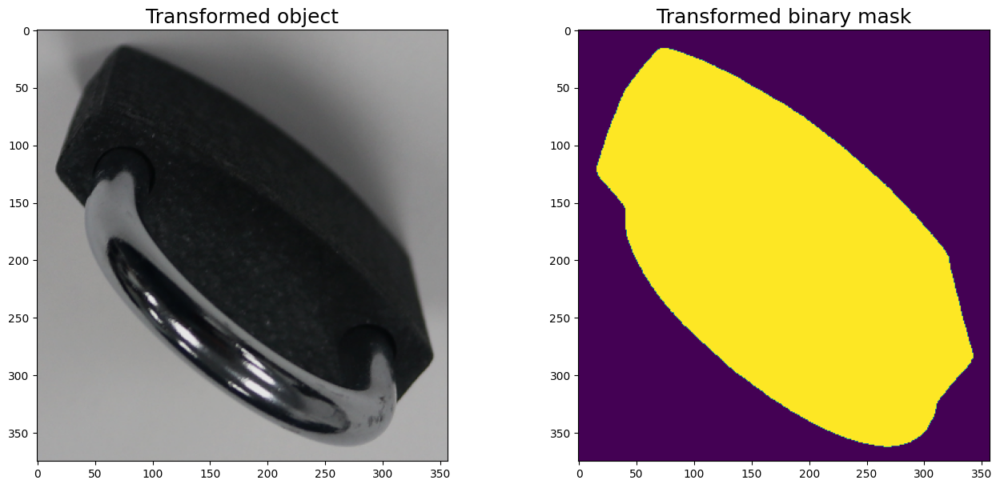

In [14]:
# Let's look how image and binary mask of a random object can be transformed
# with help of resize_transform_obj() function

img_path = obj_dict[3]['images'][10]
mask_path = obj_dict[3]['masks'][10]

img, mask = get_img_and_mask(img_path, mask_path)

img_t, mask_t = resize_transform_obj(img,
                                     mask,
                                     longest_min=300,
                                     longest_max=400,
                                     transforms=transforms_obj)

print("Shape of the image of the transformed object:", img_t.shape)
print("Shape of the transformed binary mask:", mask_t.shape)
print("\n")

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_t)
ax[0].set_title('Transformed object', fontsize=18)
ax[1].imshow(mask_t)
ax[1].set_title('Transformed binary mask', fontsize=18);

# 6. Adding object to background

In [15]:
def add_obj(img_comp, mask_comp, img, mask, x, y, idx):
    '''
    img_comp - composition of objects
    mask_comp - composition of objects` masks
    img - image of object
    mask - binary mask of object
    x, y - coordinates where center of img is placed
    Function returns img_comp in CV2 RGB format + mask_comp
    '''

    h_comp, w_comp = img_comp.shape[0], img_comp.shape[1]

    h, w = img.shape[0], img.shape[1]

    x = x - int(w/2)
    y = y - int(h/2)

    mask_b = mask == 1
    mask_rgb_b = np.stack([mask_b, mask_b, mask_b], axis=2)

    if x >= 0 and y >= 0:
        h_part = h - max(0, y+h-h_comp) # h_part - part of the image which gets into the frame of img_comp along y-axis
        w_part = w - max(0, x+w-w_comp) # w_part - part of the image which gets into the frame of img_comp along x-axis

        img_comp[y:y+h_part, x:x+w_part, :] = img_comp[y:y+h_part, x:x+w_part, :] * ~mask_rgb_b[0:h_part, 0:w_part, :] + (img * mask_rgb_b)[0:h_part, 0:w_part, :]
        mask_comp[y:y+h_part, x:x+w_part] = mask_comp[y:y+h_part, x:x+w_part] * ~mask_b[0:h_part, 0:w_part] + (idx * mask_b)[0:h_part, 0:w_part]
        mask_added = mask[0:h_part, 0:w_part]

    elif x < 0 and y < 0:

        h_part = h + y
        w_part = w + x


        img_comp[0:0+h_part, 0:0+w_part, :] = img_comp[0:0+h_part, 0:0+w_part, :] * ~mask_rgb_b[h-h_part:h, w-w_part:w, :] + (img * mask_rgb_b)[h-h_part:h, w-w_part:w, :]
        mask_comp[0:0+h_part, 0:0+w_part] = mask_comp[0:0+h_part, 0:0+w_part] * ~mask_b[h-h_part:h, w-w_part:w] + (idx * mask_b)[h-h_part:h, w-w_part:w]
        mask_added = mask[h-h_part:h, w-w_part:w]

    elif x < 0 and y >= 0:

        h_part = h - max(0, y+h-h_comp)
        w_part = w + x

        img_comp[y:y+h_part, 0:0+w_part, :] = img_comp[y:y+h_part, 0:0+w_part, :] * ~mask_rgb_b[0:h_part, w-w_part:w, :] + (img * mask_rgb_b)[0:h_part, w-w_part:w, :]
        mask_comp[y:y+h_part, 0:0+w_part] = mask_comp[y:y+h_part, 0:0+w_part] * ~mask_b[0:h_part, w-w_part:w] + (idx * mask_b)[0:h_part, w-w_part:w]
        mask_added = mask[0:h_part, w-w_part:w]

    elif x >= 0 and y < 0:

        h_part = h + y
        w_part = w - max(0, x+w-w_comp)

        img_comp[0:0+h_part, x:x+w_part, :] = img_comp[0:0+h_part, x:x+w_part, :] * ~mask_rgb_b[h-h_part:h, 0:w_part, :] + (img * mask_rgb_b)[h-h_part:h, 0:w_part, :]
        mask_comp[0:0+h_part, x:x+w_part] = mask_comp[0:0+h_part, x:x+w_part] * ~mask_b[h-h_part:h, 0:w_part] + (idx * mask_b)[h-h_part:h, 0:w_part]
        mask_added = mask[h-h_part:h, 0:w_part]

    return img_comp, mask_comp, mask_added

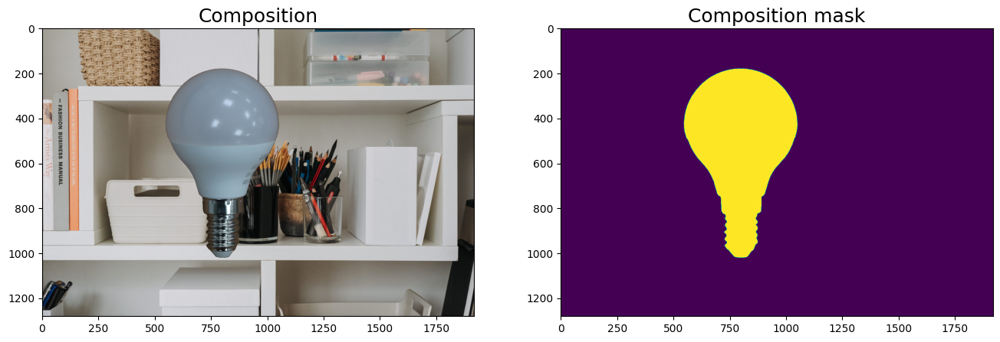

In [16]:
img_bg_path = files_bg_imgs[28]
img_bg = cv2.imread(img_bg_path)
img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)

h, w = img_bg.shape[0], img_bg.shape[1]
mask_comp = np.zeros((h,w), dtype=np.uint8)

img_path = obj_dict[2]['images'][3]
mask_path = obj_dict[2]['masks'][3]
img, mask = get_img_and_mask(img_path, mask_path)

img_comp, mask_comp, _ = add_obj(img_bg, mask_comp, img, mask, x=800, y=600, idx=1)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(mask_comp)
ax[1].set_title('Composition mask', fontsize=18);

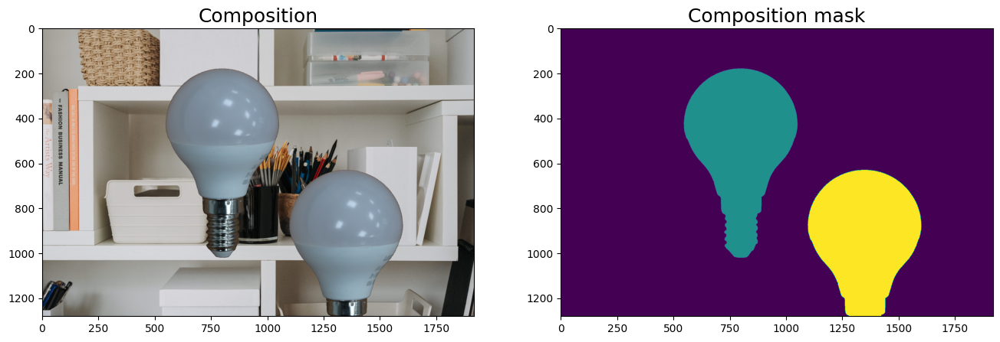

In [17]:
img_comp, mask_comp, _ = add_obj(img_comp, mask_comp, img, mask, x=1350, y=1050, idx=2)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(mask_comp)
ax[1].set_title('Composition mask', fontsize=18);

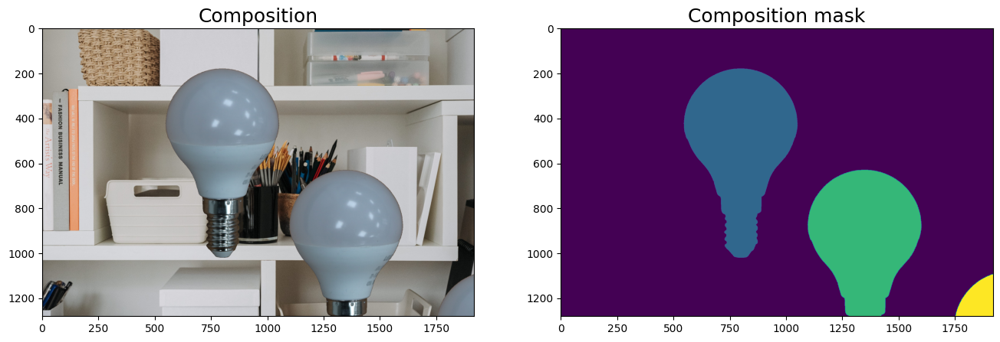

In [18]:
img_comp, mask_comp, _ = add_obj(img_comp, mask_comp, img, mask, x=2000, y=1500, idx=3)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(mask_comp)
ax[1].set_title('Composition mask', fontsize=18);

# 7. Adding noise objects to background

In [19]:
def get_mask_path(image_path):
  """
  Extracts the file name and extension file from an image path and constructs the corresponding mask path.

  Args:
    image_path: Path to the image file.

  Returns:
    Path to the corresponding mask file.
  """
  file_name_with_extension = image_path.split('/')[-1]  # Extract file name with extension
  file_name = file_name_with_extension.split('.')[0]  # Extract file name without extension
  extension = file_name_with_extension.split('.')[1] # Extract extension
  mask_path = "/content/synthetic-dataset-object-detection/data/bg_noise/masks/" + file_name + "." + extension  # Construct mask path with original extension

  return mask_path

In [20]:
def switch_path_extension_png_jpg(path):
  if path.endswith('.jpg'):
    return path[:-4] + '.png'
  elif path.endswith('.png'):
    return path[:-4] + '.jpg'
  else:
    return path

In [21]:
def get_img_and_mask_2(img_path):
    """
      This function is resilient to path extension errors involving either .jpg or .png.
    """

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # MY CODE HERE ----------
    mask_path = get_mask_path(img_path)
    # -----------------------

    mask = cv2.imread(mask_path)
    try:
      mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    except:
      mask_path = switch_path_extension_png_jpg(mask_path)
      mask = cv2.imread(mask_path)
      mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)


    mask_b = mask[:,:,0] == 0 # This is boolean mask
    mask = mask_b.astype(np.uint8) # This is binary mask

    return img, mask

In [22]:
#MY CODE -------------------
def create_bg_with_noise(files_bg_imgs,
                         files_bg_noise_imgs,
                         files_bg_noise_masks,
                         bg_max=1920,
                         bg_min=1080,
                         max_objs_to_add=60,
                         longest_bg_noise_max=1000,
                         longest_bg_noise_min=200,
                         blank_bg=False):

    if blank_bg:
        img_comp_bg = np.ones((bg_min, bg_max,3), dtype=np.uint8) * 255
        mask_comp_bg = np.zeros((bg_min, bg_max), dtype=np.uint8)
    else:
        idx = np.random.randint(len(files_bg_imgs))
        img_bg = cv2.imread(files_bg_imgs[idx])
        img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)
        img_comp_bg = resize_img(img_bg, bg_max, bg_min)
        mask_comp_bg = np.zeros((img_comp_bg.shape[0], img_comp_bg.shape[1]), dtype=np.uint8)

    for i in range(1, np.random.randint(max_objs_to_add) + 2):
        idx = np.random.randint(len(files_bg_noise_imgs))

        # MY CODE HERE ----------
        image_path = files_bg_noise_imgs[idx]
        img, mask = get_img_and_mask_2(files_bg_noise_imgs[idx])
        # -----------------------

        x, y = np.random.randint(img_comp_bg.shape[1]), np.random.randint(img_comp_bg.shape[0])
        img_t, mask_t = resize_transform_obj(img, mask, longest_bg_noise_min, longest_bg_noise_max, transforms=transforms_bg_obj)
        img_comp_bg, _, _ = add_obj(img_comp_bg, mask_comp_bg, img_t, mask_t, x, y, i)

    return img_comp_bg

In [23]:
ls '/content/synthetic-dataset-object-detection/data/bg_noise/masks/'

100.png  11.png  1.png   28.png  36.png  44.png  52.png  60.png  69.png  77.png  85.png  93.png
101.png  12.png  20.png  29.png  37.png  45.png  53.png  61.png  6.png   78.png  86.png  94.png
102.png  13.png  21.png  2.png   38.png  46.png  54.png  62.png  70.png  79.png  87.png  95.png
103.png  14.png  22.png  30.png  39.png  47.png  55.png  63.png  71.png  7.png   88.png  96.png
104.png  15.png  23.png  31.png  3.jpg   48.png  56.png  64.png  72.png  80.png  89.png  97.png
105.png  16.png  24.png  32.png  40.png  49.png  57.png  65.png  73.png  81.png  8.png   98.png
106.png  17.png  25.png  33.png  41.png  4.png   58.png  66.png  74.png  82.png  90.png  99.png
107.png  18.png  26.png  34.png  42.png  50.png  59.png  67.png  75.png  83.png  91.png  9.png
10.png   19.png  27.png  35.png  43.png  51.jpg  5.png   68.png  76.png  84.png  92.png


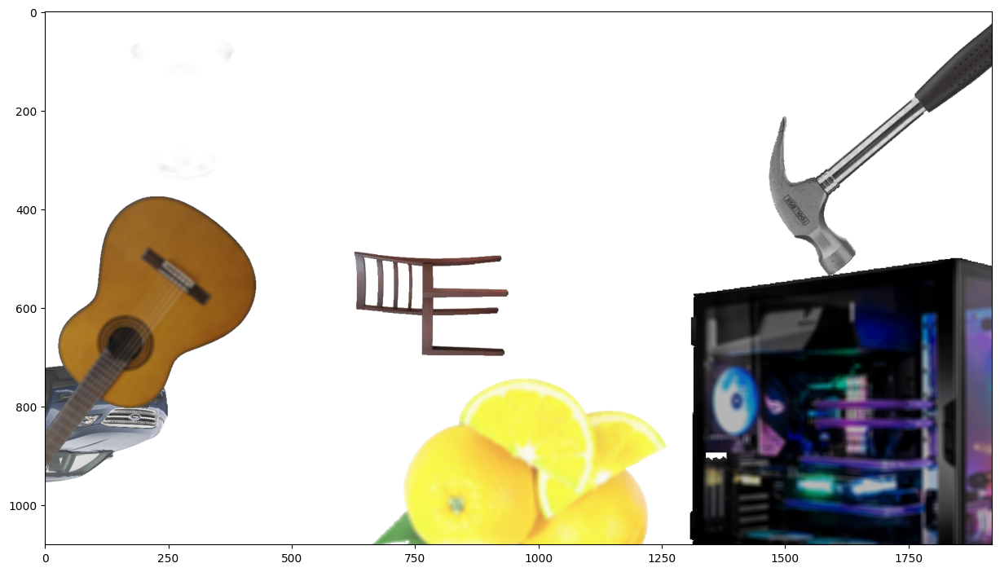

In [24]:
img_comp_bg = create_bg_with_noise(files_bg_imgs,
                                   files_bg_noise_imgs,
                                   files_bg_noise_masks,
                                   max_objs_to_add=20,
                                   blank_bg=True)
plt.figure(figsize=(15,15))
plt.imshow(img_comp_bg)

# 8. Controlling degree of overlapping

In [25]:
def check_areas(mask_comp, obj_areas, overlap_degree=0.3):
    obj_ids = np.unique(mask_comp).astype(np.uint8)[1:-1]
    masks = mask_comp == obj_ids[:, None, None]

    ok = True

    if len(np.unique(mask_comp)) != np.max(mask_comp) + 1:
        ok = False
        return ok

    for idx, mask in enumerate(masks):
        if np.count_nonzero(mask) / obj_areas[idx] < 1 - overlap_degree:
            ok = False
            break

    return ok

# 9. Creating synthetic composition

In [26]:
def create_composition(img_comp_bg,
                       max_objs=15,
                       overlap_degree=0.2,
                       max_attempts_per_obj=10):

    img_comp = img_comp_bg.copy()
    h, w = img_comp.shape[0], img_comp.shape[1]
    mask_comp = np.zeros((h,w), dtype=np.uint8)

    obj_areas = []
    labels_comp = []
    num_objs = np.random.randint(max_objs) + 2

    i = 1

    for _ in range(1, num_objs):

        obj_idx = np.random.randint(len(obj_dict)) + 1

        for _ in range(max_attempts_per_obj):

            imgs_number = len(obj_dict[obj_idx]['images'])
            idx = np.random.randint(imgs_number)
            img_path = obj_dict[obj_idx]['images'][idx]
            mask_path = obj_dict[obj_idx]['masks'][idx]
            img, mask = get_img_and_mask(img_path, mask_path)

            x, y = np.random.randint(w), np.random.randint(h)
            longest_min = obj_dict[obj_idx]['longest_min']
            longest_max = obj_dict[obj_idx]['longest_max']
            img, mask = resize_transform_obj(img,
                                             mask,
                                             longest_min,
                                             longest_max,
                                             transforms=transforms_obj)

            if i == 1:
                img_comp, mask_comp, mask_added = add_obj(img_comp,
                                                          mask_comp,
                                                          img,
                                                          mask,
                                                          x,
                                                          y,
                                                          i)
                obj_areas.append(np.count_nonzero(mask_added))
                labels_comp.append(obj_idx)
                i += 1
                break
            else:
                img_comp_prev, mask_comp_prev = img_comp.copy(), mask_comp.copy()
                img_comp, mask_comp, mask_added = add_obj(img_comp,
                                                          mask_comp,
                                                          img,
                                                          mask,
                                                          x,
                                                          y,
                                                          i)
                ok = check_areas(mask_comp, obj_areas, overlap_degree)
                if ok:
                    obj_areas.append(np.count_nonzero(mask_added))
                    labels_comp.append(obj_idx)
                    i += 1
                    break
                else:
                    img_comp, mask_comp = img_comp_prev.copy(), mask_comp_prev.copy()

    return img_comp, mask_comp, labels_comp, obj_areas

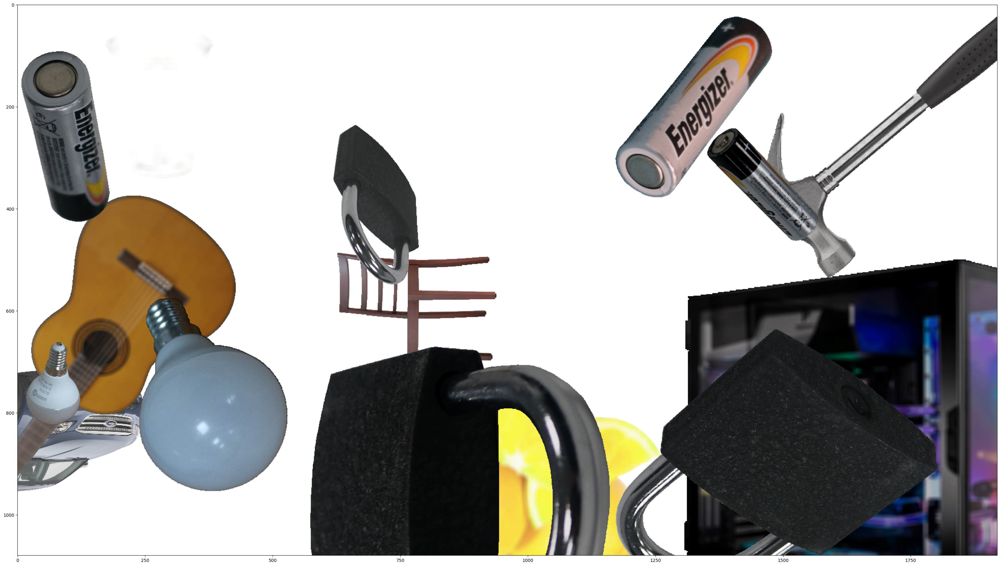

In [27]:
img_comp, mask_comp, labels_comp, obj_areas = create_composition(img_comp_bg,
                                                                 max_objs=15,
                                                                 overlap_degree=0.2,
                                                                 max_attempts_per_obj=10)
plt.figure(figsize=(40,40))
plt.imshow(img_comp)

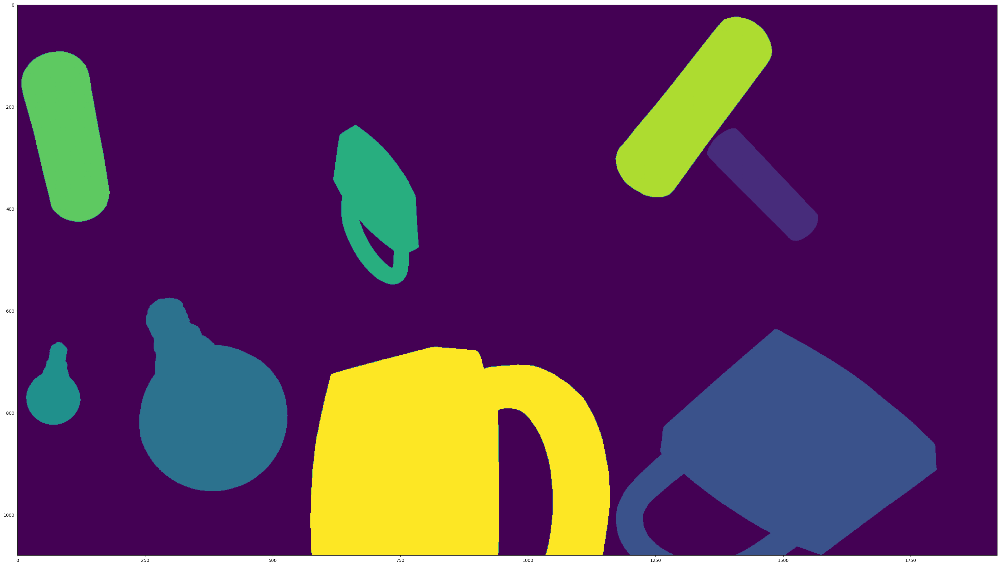

In [28]:
plt.figure(figsize=(40,40))
plt.imshow(mask_comp)

In [29]:
print("Labels (classes of the objects) on the composition in order of object's addition:", labels_comp)

Labels (classes of the objects) on the composition in order of object's addition: [1, 3, 2, 2, 3, 1, 1, 3]


In [30]:
obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
masks = mask_comp == obj_ids[:, None, None]

print("Degree of how much area of each object is overlapped:")

for idx, mask in enumerate(masks):
    print(np.count_nonzero(mask) / obj_areas[idx])

Degree of how much area of each object is overlapped:
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


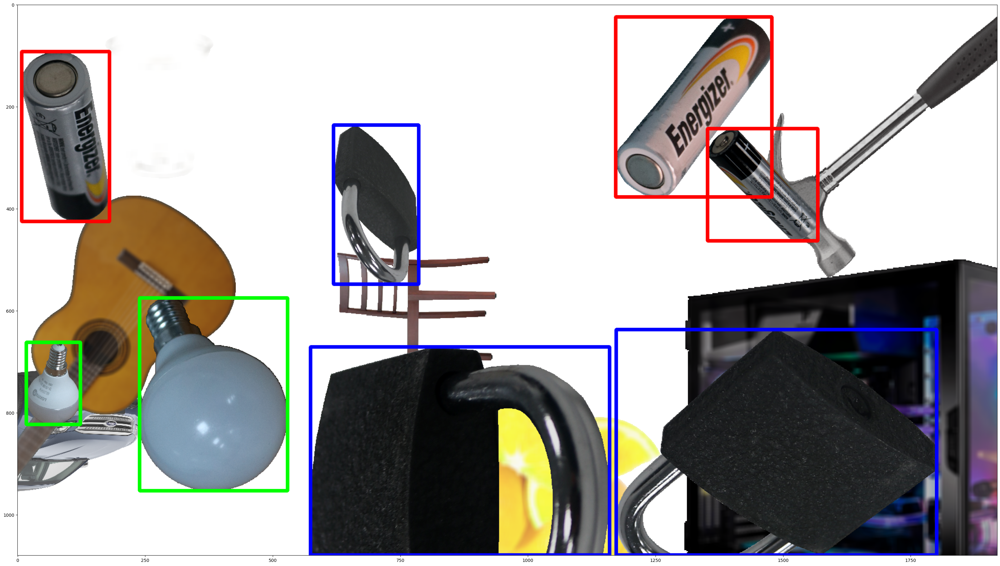

In [31]:
colors = {1: (255,0,0), 2: (0,255,0), 3: (0,0,255)}

img_comp_bboxes = img_comp.copy()

obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
masks = mask_comp == obj_ids[:, None, None]

for i in range(len(obj_ids)):
    pos = np.where(masks[i])
    xmin = np.min(pos[1])
    xmax = np.max(pos[1])
    ymin = np.min(pos[0])
    ymax = np.max(pos[0])
    img_comp_bboxes = cv2.rectangle(img_comp_bboxes,
                                    (xmin, ymin),
                                    (xmax,ymax),
                                    colors[labels_comp[i]],
                                    6)

plt.figure(figsize=(40,40))
plt.imshow(img_comp_bboxes)

# 10. Annotations in YOLO format

In [32]:
def create_yolo_annotations(mask_comp, labels_comp):
    comp_w, comp_h = mask_comp.shape[1], mask_comp.shape[0]

    obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
    masks = mask_comp == obj_ids[:, None, None]

    annotations_yolo = []
    for i in range(len(labels_comp)):
        pos = np.where(masks[i])
        xmin = np.min(pos[1])
        xmax = np.max(pos[1])
        ymin = np.min(pos[0])
        ymax = np.max(pos[0])

        xc = (xmin + xmax) / 2
        yc = (ymin + ymax) / 2
        w = xmax - xmin
        h = ymax - ymin

        annotations_yolo.append([labels_comp[i] - 1,
                                 round(xc/comp_w, 5),
                                 round(yc/comp_h, 5),
                                 round(w/comp_w, 5),
                                 round(h/comp_h, 5)])

    return annotations_yolo

In [33]:
annotations_yolo = create_yolo_annotations(mask_comp, labels_comp)
for i in range(len(annotations_yolo)):
    print(' '.join(str(el) for el in annotations_yolo[i]))

0 0.76042 0.32685 0.1125 0.2037
2 0.77448 0.79444 0.32708 0.40926
1 0.2 0.70741 0.15104 0.35
1 0.03646 0.6875 0.05521 0.14907
2 0.36589 0.36296 0.08698 0.28889
0 0.04896 0.23935 0.08958 0.30833
0 0.6901 0.18565 0.15937 0.32685
2 0.45156 0.81019 0.30521 0.37778


# 11. Creating and saving synthetic dataset

In [34]:
def generate_dataset(imgs_number, folder, split='train'):
    time_start = time.time()
    for j in tqdm(range(imgs_number)):
        img_comp_bg = create_bg_with_noise(files_bg_imgs,
                                           files_bg_noise_imgs,
                                           files_bg_noise_masks,
                                           max_objs_to_add=60)

        img_comp, mask_comp, labels_comp, _ = create_composition(img_comp_bg,
                                                                 max_objs=15,
                                                                 overlap_degree=0.2,
                                                                 max_attempts_per_obj=10)

        img_comp = cv2.cvtColor(img_comp, cv2.COLOR_RGB2BGR)
        cv2.imwrite(os.path.join(folder, split, 'images/{}.jpg').format(j), img_comp)

        annotations_yolo = create_yolo_annotations(mask_comp, labels_comp)
        for i in range(len(annotations_yolo)):
            with open(os.path.join(folder, split, 'labels/{}.txt').format(j), "a") as f:
                f.write(' '.join(str(el) for el in annotations_yolo[i]) + '\n')

    time_end = time.time()
    time_total = round(time_end - time_start)
    time_per_img = round((time_end - time_start) / imgs_number, 1)
    print(f"{j} images generated\n")

    print("Generation of {} synthetic images is completed. It took {} seconds, or {} seconds per image".format(imgs_number, time_total, time_per_img))
    print("Images are stored in '{}'".format(os.path.join(folder, split, 'images')))
    print("Annotations are stored in '{}'".format(os.path.join(folder, split, 'labels')))

In [35]:
"""
Now, create folders:
  dataset/train/images/,
  dataset/train/labels/,
  dataset/valid/images/,
  dataset/valid/labels/

where function generate_dataset() will save images and annotations.
"""

'\nNow, create folders: \n  dataset/train/images/, \n  dataset/train/labels/, \n  dataset/valid/images/, \n  dataset/valid/labels/\n   \nwhere function generate_dataset() will save images and annotations.\n'

In [36]:
# MY CODE HERE ---------------------------------------
def create_dataset_dirs():
  os.makedirs('/content/dataset/train/images')
  os.makedirs('/content/dataset/train/labels')
  os.makedirs('/content/dataset/valid/images')
  os.makedirs('/content/dataset/valid/labels')

def remove_dataset_dir():
  try:
    shutil.rmtree('/content/dataset/')
  except:
    pass

def reset_dataset_dirs():
  remove_dataset_dir()
  create_dataset_dirs()
# ----------------------------------------------------

In [42]:
reset_dataset_dirs()
generate_dataset(20, folder='dataset', split='train') # 1000
generate_dataset(4, folder='dataset', split='valid') # 200

100%|██████████| 20/20 [01:13<00:00,  3.68s/it]


19 images generated

Generation of 20 synthetic images is completed. It took 74 seconds, or 3.7 seconds per image
Images are stored in 'dataset/train/images'
Annotations are stored in 'dataset/train/labels'


100%|██████████| 4/4 [00:10<00:00,  2.65s/it]

3 images generated

Generation of 4 synthetic images is completed. It took 11 seconds, or 2.7 seconds per image
Images are stored in 'dataset/valid/images'
Annotations are stored in 'dataset/valid/labels'


In [ ]:
#unnecessary
def show_image_boxes(image_path):
  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  colors = {1: (255,0,0), 2: (0,255,0), 3: (0,0,255)}

  img_comp_bboxes = image.copy()

  obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
  masks = mask_comp == obj_ids[:, None, None]

  for i in range(len(obj_ids)):
      pos = np.where(masks[i])
      xmin = np.min(pos[1])
      xmax = np.max(pos[1])
      ymin = np.min(pos[0])
      ymax = np.max(pos[0])
      img_comp_bboxes = cv2.rectangle(img_comp_bboxes,
                                      (xmin, ymin),
                                      (xmax,ymax),
                                      colors[labels_comp[i]],
                                      6)

  plt.figure(figsize=(40,40))
  plt.imshow(img_comp_bboxes)



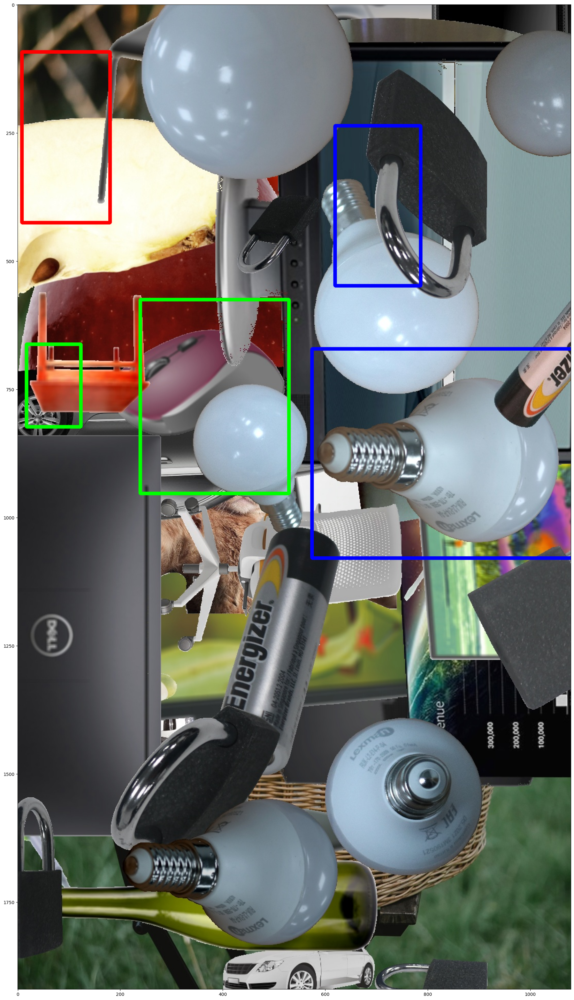

In [46]:
image_path = '/content/dataset/train/images/10.jpg'
show_image_boxes(image_path)